## Analysis v5: Detecting Covariant Sites 

In [75]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
from natsort import index_natsorted

In [95]:
# Set color values
dutchfield = ["#e60049", "#0bb4ff", "#50e991", "#e6d800", "#9b19f5", "#ffa300", "#dc0ab4", "#b3d4ff", "#00bfa0"]

springpastel = ["#fd7f6f", "#7eb0d5", "#b2e061", "#bd7ebe", "#ffb55a", "#ffee65", "#beb9db", "#fdcce5", "#8bd3c7"]

### Calculating the Variance of the AF and FPS values 

It would be quite interesting to see if for each variant site per motif, the variance of the AF and FPS values are correlated.

I.e. if a variant site has a high variance in AF values, does it also have a high variance in FPS values?

First, load the data file as dataframe and then truncate the columns to include on AF and FPS data. Next, convert the dataframe into long format.

In [3]:
# import the data
# filepath = '/home/users/ntu/suffiazi/scratch/outputs/tmp/input_data/E2F5_E2F5_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
filepath = '../raw-data/combined_matrix/EGR1_EGR1_HUMAN.H11MO.0.A_fpscore-af-varsites-combined-matrix-wide.tsv'
dt_afps = pd.read_csv(filepath, sep='\t')
# extract motif id from filename
motif_id = os.path.basename(filepath).replace('_fpscore-af-varsites-combined-matrix-wide.tsv', '')
motif_id

'EGR1_EGR1_HUMAN.H11MO.0.A'

In [4]:
dt_afps.head()

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,...,ANAB5F7_basal_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,region_id
0,chr1,91471,91488,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.000000,91475.0,G,A,0.088235,NaN,NaN,NaN,0.000000,chr1:91471-91488
1,chr1,136956,136973,0.0,0.0,0.0,0.0,0.0,136962.0,C,...,0.176471,136962.0,C,T,0.184211,136962.0,C,T,0.235294,chr1:136956-136973
2,chr1,181096,181113,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,chr1:181096-181113
3,chr1,181520,181537,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.088235,181526.0,C,T,0.052632,181526.0,C,T,0.117647,chr1:181520-181537
4,chr1,181577,181594,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,181583.0,CGGGGGGGGGGGGGGGGG,CGGGGGGGGGGGGG,0.117647,chr1:181577-181594


Let's filter the loaded table to include only the `_AF` and `_fps` columns, as well as the `region_id` column.

In [5]:
afps_df = dt_afps.filter(regex='_AF$|_fps$|_id$').copy()
afps_df.head(5)

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.0,0.0,0.0,0.0,0.0,0.0000,0.000,0.000000,0.088235,0.000000,chr1:91471-91488
1,0.0,0.0,0.0,0.0,0.0,0.4375,0.000,0.176471,0.184211,0.235294,chr1:136956-136973
2,0.0,0.0,0.0,0.0,0.0,0.0000,0.000,0.000000,0.000000,0.000000,chr1:181096-181113
3,0.0,0.0,0.0,0.0,0.0,0.0000,0.125,0.088235,0.052632,0.117647,chr1:181520-181537
4,0.0,0.0,0.0,0.0,0.0,0.0000,0.000,0.000000,0.000000,0.117647,chr1:181577-181594


In [6]:
# convert to long format
afps_df_long = afps_df.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
afps_df_long[['sample_id', 'type']] = afps_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the redundant 'variable' column
afps_df_long = afps_df_long.drop(columns=["variable"])

# now pivot the dataframe to create new columns based on the type column
afps_df_lpv = afps_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
afps_df_lpv = afps_df_lpv.rename_axis(None, axis=1).rename(columns={'fps': 'FPS'})

# sort the dataframe by region_id naturally
afps_df_lpv = afps_df_lpv.reindex(index=index_natsorted(afps_df_lpv['region_id']))
afps_df_lpv = afps_df_lpv.reset_index(drop=True)
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:91471-91488,2GAMBDQ_norm,0.000000,0.00000
1,chr1:91471-91488,98JKPD8_lumA,0.000000,0.00000
2,chr1:91471-91488,ANAB5F7_basal,0.000000,0.00000
3,chr1:91471-91488,PU24GB8_lumB,0.088235,0.00000
4,chr1:91471-91488,S6R691V_her2,0.000000,0.00000
...,...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220
303036,chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863
303037,chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337
303038,chrY:26403289-26403306,PU24GB8_lumB,1.000000,0.02166


### AF–FPS Matrix
At this point, we now have both a matrix of AF and FPS values in wide form (`afps_df`) and the same dataset in long form (`afps_df_lpv`). We can scale the FPS values to be between 0 and 1 now.

In [7]:
# use MinMaxScaler to scale the raw fps values to range between 0 and 1
from sklearn.preprocessing import MinMaxScaler
# scale the FPS values to a range of 0-1
# Initialize a MinMaxScaler
scaler = MinMaxScaler()

# copy df
fps_df_scaled = dt_afps.filter(regex='_fps$|_id$').copy()

# set the index to 'region_id'
fps_df_scaled = fps_df_scaled.set_index('region_id')

# Fit the MinMaxScaler to the 'FPS' column and transform it
fps_df_scaled = pd.DataFrame(scaler.fit_transform(fps_df_scaled), columns=fps_df_scaled.columns, index=fps_df_scaled.index)

# rename columns by adding '_scaled' to the column names
fps_df_scaled = fps_df_scaled.add_suffix('_scaled')
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:91471-91488,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:136956-136973,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181096-181113,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181520-181537,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181577-181594,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
chrY:11136400-11136417,0.000000,0.000000,0.000000,0.000000,0.000000
chrY:11136547-11136564,0.000000,0.000000,0.000000,0.000000,0.000000
chrY:11153536-11153553,0.000000,0.000000,0.000000,0.000000,0.000000


Now we should convert the FPS scaled dataframe into long form.

In [8]:
# reset index
fps_df_scaled_long = fps_df_scaled.reset_index()
# convert to long format
fps_df_scaled_long = fps_df_scaled_long.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
# Split the 'variable' column into three parts
fps_df_scaled_long[['part1', 'part2', 'part3']] = fps_df_scaled_long['variable'].str.rsplit('_', n=2, expand=True)

# Assign part1 to 'sample_id' and concatenate the other parts to form 'type'
fps_df_scaled_long['sample_id'] = fps_df_scaled_long['part1']
fps_df_scaled_long['type'] = fps_df_scaled_long['part2'].str.upper() + '_' + fps_df_scaled_long['part3']

# Drop the unnecessary columns
fps_df_scaled_long = fps_df_scaled_long.drop(['variable', 'part1', 'part2', 'part3'], axis=1)

# now pivot the dataframe to create new columns based on the type column
fps_df_scaled_lpv = fps_df_scaled_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
fps_df_scaled_lpv = fps_df_scaled_lpv.rename_axis(None, axis=1)

# sort the dataframe by region_id naturally
fps_df_scaled_lpv = fps_df_scaled_lpv.reindex(index=index_natsorted(fps_df_scaled_lpv['region_id']))
fps_df_scaled_lpv = fps_df_scaled_lpv.reset_index(drop=True)
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:91471-91488,2GAMBDQ_norm,0.000000
1,chr1:91471-91488,98JKPD8_lumA,0.000000
2,chr1:91471-91488,ANAB5F7_basal,0.000000
3,chr1:91471-91488,PU24GB8_lumB,0.000000
4,chr1:91471-91488,S6R691V_her2,0.000000
...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.000179
303036,chrY:26403289-26403306,98JKPD8_lumA,0.000223
303037,chrY:26403289-26403306,ANAB5F7_basal,0.000153
303038,chrY:26403289-26403306,PU24GB8_lumB,0.000207


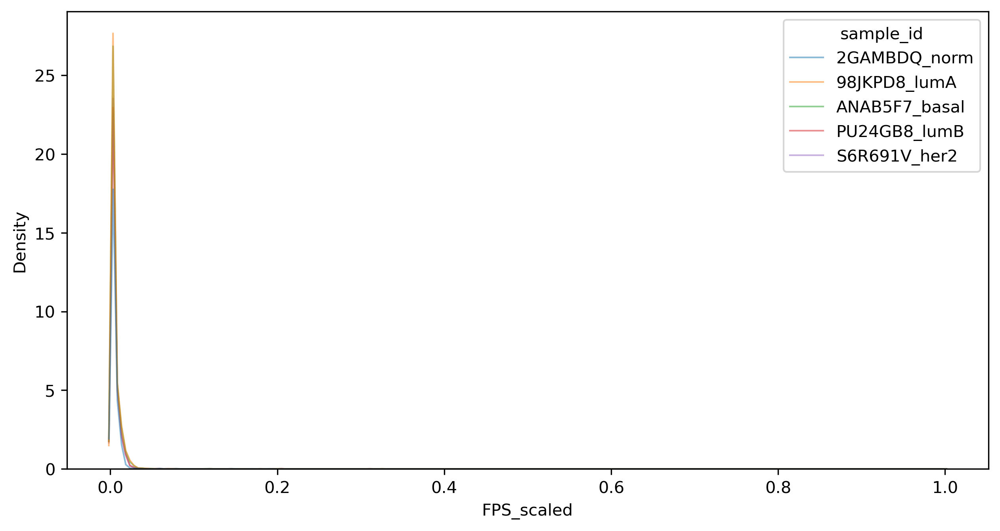

In [9]:
# plot fps distribution
plt.figure(figsize=(10, 5), dpi=300)
sns.kdeplot(data=fps_df_scaled_lpv, x="FPS_scaled", hue="sample_id", fill=False, common_norm=False, alpha=.5, linewidth=1)
plt.show()

### Merging `afps_df_lpv` and `fps_df_scaled_lpv`

Now we can merge the two long dataframes together to get both raw FPS and scaled FPS values in one dataframe.

In [10]:
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:91471-91488,2GAMBDQ_norm,0.000000,0.00000
1,chr1:91471-91488,98JKPD8_lumA,0.000000,0.00000
2,chr1:91471-91488,ANAB5F7_basal,0.000000,0.00000
3,chr1:91471-91488,PU24GB8_lumB,0.088235,0.00000
4,chr1:91471-91488,S6R691V_her2,0.000000,0.00000
...,...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220
303036,chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863
303037,chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337
303038,chrY:26403289-26403306,PU24GB8_lumB,1.000000,0.02166


In [11]:
# merge two dataframes on region_id and sample_id
afps_full_dfl = afps_df_lpv.merge(fps_df_scaled_lpv, on=['region_id', 'sample_id'])
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:91471-91488,2GAMBDQ_norm,0.000000,0.00000,0.000000
1,chr1:91471-91488,98JKPD8_lumA,0.000000,0.00000,0.000000
2,chr1:91471-91488,ANAB5F7_basal,0.000000,0.00000,0.000000
3,chr1:91471-91488,PU24GB8_lumB,0.088235,0.00000,0.000000
4,chr1:91471-91488,S6R691V_her2,0.000000,0.00000,0.000000
...,...,...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220,0.000179
303036,chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863,0.000223
303037,chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337,0.000153
303038,chrY:26403289-26403306,PU24GB8_lumB,1.000000,0.02166,0.000207


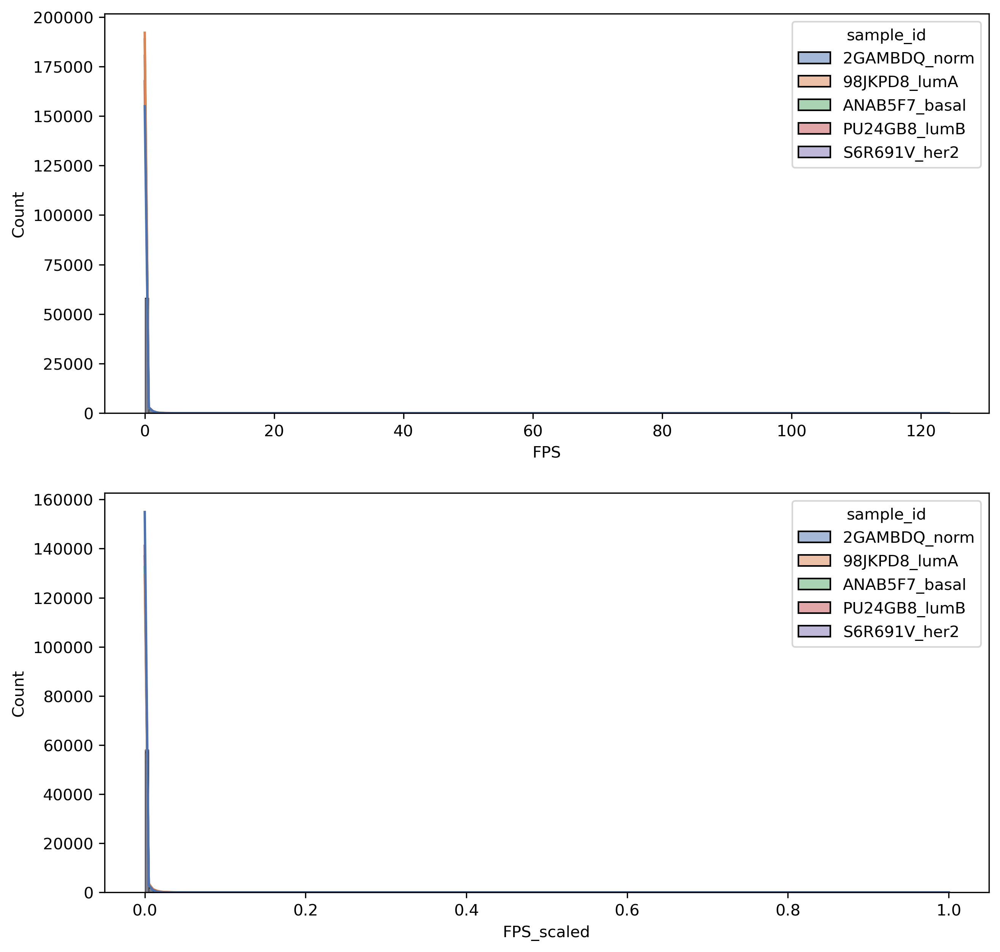

In [12]:
# Create a figure and a 2x2 grid of subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10), dpi=300)
sns.histplot(data=afps_full_dfl, x="FPS", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[0])
sns.histplot(data=afps_full_dfl, x="FPS_scaled", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[1])
# # now draw a subset plot where x is above a certain threshold
# sns.histplot(data=afps_full_dfl[afps_full_dfl['FPS'] > 0.5], x="FPS", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[2])
# plt.title(f"FPS distribution of {motif_id} in all samples")
plt.show()

Text(0.5, 0.98, 'Jointpot of AF and scaled FPS values of EGR1_EGR1_HUMAN.H11MO.0.A')

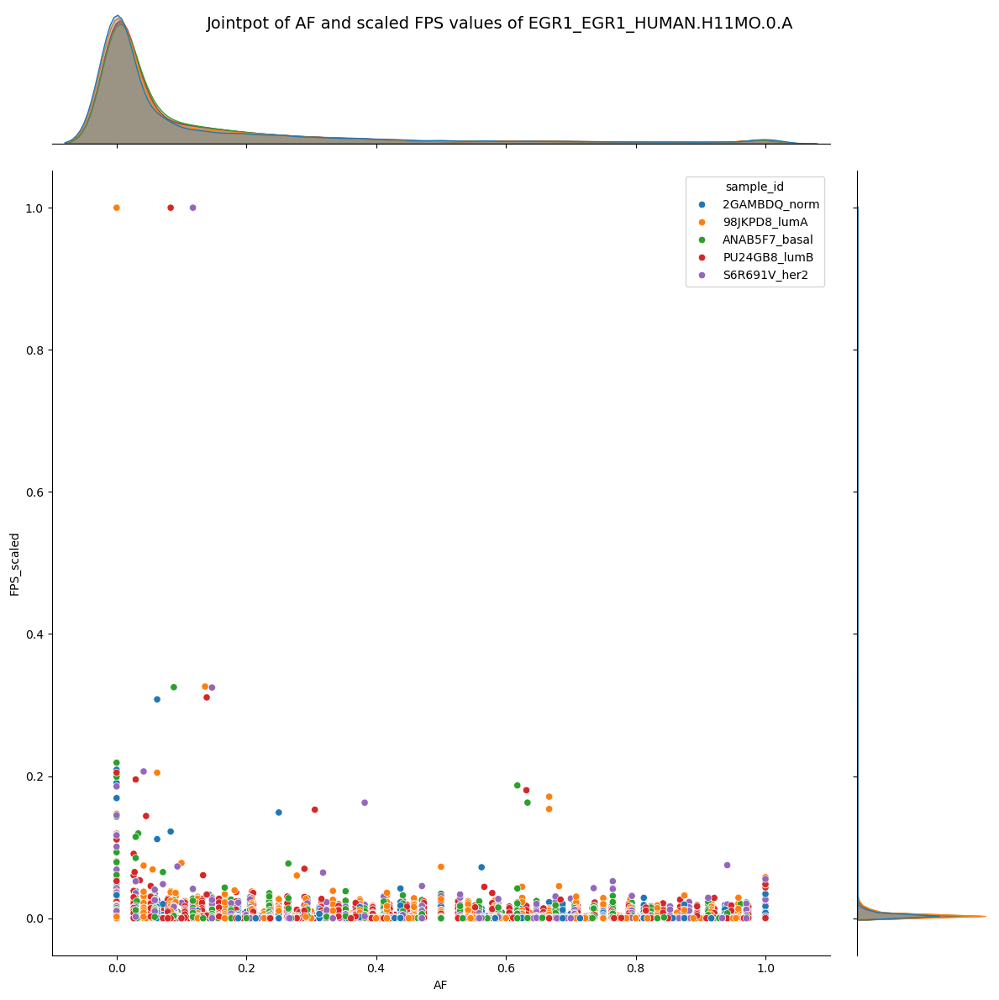

In [13]:
g = sns.jointplot(data=afps_full_dfl, x='AF', y='FPS_scaled', kind='scatter', hue='sample_id', height=12)
plt.xlim(-0.1, 1.1)
g.figure.suptitle(f"Jointpot of AF and scaled FPS values of {motif_id}", fontsize=14)

### Filtering Zero Sites

We should filter out the sites that have zero AF values in ALL subtypes, as these are not informative for our analysis. We will also filter out the sites that have zero FPS values in ALL subtypes.

In [14]:
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:91471-91488,2GAMBDQ_norm,0.000000,0.00000,0.000000
1,chr1:91471-91488,98JKPD8_lumA,0.000000,0.00000,0.000000
2,chr1:91471-91488,ANAB5F7_basal,0.000000,0.00000,0.000000
3,chr1:91471-91488,PU24GB8_lumB,0.088235,0.00000,0.000000
4,chr1:91471-91488,S6R691V_her2,0.000000,0.00000,0.000000
...,...,...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220,0.000179
303036,chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863,0.000223
303037,chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337,0.000153
303038,chrY:26403289-26403306,PU24GB8_lumB,1.000000,0.02166,0.000207


`FPS` value `== 0` means that the raw FPS values across subtypes are zero, i.e. there is no evidence of footprinting at all at these sites despite a TFBS matching a motif being present (assigned by TOBIAS). AF value `== 0` means that there is no evidence of a variant genotype at these sites across the samples making up a subtype. 

In [15]:
# filter out unique region_id rows that have fps == 0 across the sample_ids and AF == 0
# group by 'region_id' first 
merged_filt_dfl = afps_full_dfl.groupby('region_id').filter(lambda x: x['FPS'].sum() > 0 and x['AF'].sum() > 0)
merged_filt_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
60,chr1:818800-818817,2GAMBDQ_norm,0.937500,0.04729,0.000380
61,chr1:818800-818817,98JKPD8_lumA,0.909091,0.03322,0.000397
62,chr1:818800-818817,ANAB5F7_basal,0.843750,0.03123,0.000357
63,chr1:818800-818817,PU24GB8_lumB,0.842105,0.02999,0.000286
64,chr1:818800-818817,S6R691V_her2,0.852941,0.03182,0.000337
...,...,...,...,...,...
303035,chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220,0.000179
303036,chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863,0.000223
303037,chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337,0.000153
303038,chrY:26403289-26403306,PU24GB8_lumB,1.000000,0.02166,0.000207


### Calculating Variation Statistics
With the full data table cleaned up into a long format, we can now calculate the variation statistics for each region. We will calculate variance (Var).


A) First calculate statistics on the raw FPS data.

In [16]:
# extract fps columns
fps_df = dt_afps.filter(regex='_fps$|_id$').copy()
fps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
0,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:91471-91488
1,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:136956-136973
2,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:181096-181113
3,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:181520-181537
4,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:181577-181594
...,...,...,...,...,...,...
60603,0.00000,0.00000,0.00000,0.00000,0.00000,chrY:11136400-11136417
60604,0.00000,0.00000,0.00000,0.00000,0.00000,chrY:11136547-11136564
60605,0.00000,0.00000,0.00000,0.00000,0.00000,chrY:11153536-11153553
60606,0.19335,0.20940,0.24918,0.29168,0.31666,chrY:14328812-14328829


Now filter out the rows whose `region_id` is not in the `region_id` column of `merged_filt`. First, reduce the repeated `region_id` column to unique values in `merged_filt`.

In [17]:
# this creates an array
merged_filt_uniq_region_id = merged_filt_dfl['region_id'].unique()

In [18]:
# then using this array, keep only the rows in the fps_df that have `region_id` values in the array
fps_df_filt = fps_df[fps_df['region_id'].isin(merged_filt_uniq_region_id)]
fps_df_filt

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
12,0.03322,0.03123,0.03182,0.02999,0.04729,chr1:818800-818817
13,0.01488,0.01266,0.01205,0.02023,0.01643,chr1:875872-875889
14,0.02180,0.02026,0.02328,0.02132,0.02740,chr1:875998-876015
15,0.01976,0.00986,0.01985,0.01632,0.02896,chr1:876155-876172
16,0.02780,0.01598,0.02399,0.02176,0.02896,chr1:876204-876221
...,...,...,...,...,...,...
60589,0.01564,0.01246,0.01346,0.01616,0.02785,chrY:10092523-10092540
60595,0.00790,0.00507,0.00844,0.01896,0.01653,chrY:11067859-11067876
60597,0.00622,0.00448,0.00634,0.01485,0.01244,chrY:11067917-11067934
60606,0.19335,0.20940,0.24918,0.29168,0.31666,chrY:14328812-14328829


In [19]:
# calculate variance of fps values across samples per region_id and add to a new column called 'fps_var'
fps_df_filt_ind = fps_df_filt.set_index('region_id')
fps_df_filt_ind['FPS_var'] = fps_df_filt_ind.var(axis=1)

fps_df_filt_ind

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,FPS_var
region_id,,,,,,
chr1:818800-818817,0.03322,0.03123,0.03182,0.02999,0.04729,0.000051
chr1:875872-875889,0.01488,0.01266,0.01205,0.02023,0.01643,0.000011
chr1:875998-876015,0.02180,0.02026,0.02328,0.02132,0.02740,0.000008
chr1:876155-876172,0.01976,0.00986,0.01985,0.01632,0.02896,0.000048
chr1:876204-876221,0.02780,0.01598,0.02399,0.02176,0.02896,0.000027
...,...,...,...,...,...,...
chrY:10092523-10092540,0.01564,0.01246,0.01346,0.01616,0.02785,0.000038
chrY:11067859-11067876,0.00790,0.00507,0.00844,0.01896,0.01653,0.000036
chrY:11067917-11067934,0.00622,0.00448,0.00634,0.01485,0.01244,0.000020


B) Then do the same on the fps scaled data.

Filter out the rows whose `region_id` is not in the `region_id` column of `merged_filt_scaled`.

In [20]:
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:91471-91488,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:136956-136973,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181096-181113,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181520-181537,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:181577-181594,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
chrY:11136400-11136417,0.000000,0.000000,0.000000,0.000000,0.000000
chrY:11136547-11136564,0.000000,0.000000,0.000000,0.000000,0.000000
chrY:11153536-11153553,0.000000,0.000000,0.000000,0.000000,0.000000


In [21]:
# region_id in the scaled df is already used as index, so filter by index
fps_df_scaled_filt = fps_df_scaled[fps_df_scaled.index.isin(merged_filt_uniq_region_id)]
fps_df_scaled_filt


,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:818800-818817,0.000397,0.000357,0.000337,0.000286,0.000380
chr1:875872-875889,0.000178,0.000145,0.000128,0.000193,0.000132
chr1:875998-876015,0.000261,0.000232,0.000247,0.000204,0.000220
chr1:876155-876172,0.000236,0.000113,0.000210,0.000156,0.000233
chr1:876204-876221,0.000332,0.000183,0.000254,0.000208,0.000233
...,...,...,...,...,...
chrY:10092523-10092540,0.000187,0.000143,0.000143,0.000154,0.000224
chrY:11067859-11067876,0.000094,0.000058,0.000089,0.000181,0.000133
chrY:11067917-11067934,0.000074,0.000051,0.000067,0.000142,0.000100


In [22]:
# copy the slice
fps_df_scaled_filt_ind = fps_df_scaled_filt.copy()
fps_df_scaled_filt_ind

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:818800-818817,0.000397,0.000357,0.000337,0.000286,0.000380
chr1:875872-875889,0.000178,0.000145,0.000128,0.000193,0.000132
chr1:875998-876015,0.000261,0.000232,0.000247,0.000204,0.000220
chr1:876155-876172,0.000236,0.000113,0.000210,0.000156,0.000233
chr1:876204-876221,0.000332,0.000183,0.000254,0.000208,0.000233
...,...,...,...,...,...
chrY:10092523-10092540,0.000187,0.000143,0.000143,0.000154,0.000224
chrY:11067859-11067876,0.000094,0.000058,0.000089,0.000181,0.000133
chrY:11067917-11067934,0.000074,0.000051,0.000067,0.000142,0.000100


In [23]:
# calculate variance of fps_scaled values across samples per region_id and add to a new column called 'fps_scaled_var'
fps_df_scaled_filt_ind['FPS_scaled_var'] = fps_df_scaled_filt_ind.var(axis=1)
fps_df_scaled_filt_ind

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled,FPS_scaled_var
region_id,,,,,,
chr1:818800-818817,0.000397,0.000357,0.000337,0.000286,0.000380,1.853793e-09
chr1:875872-875889,0.000178,0.000145,0.000128,0.000193,0.000132,8.383853e-10
chr1:875998-876015,0.000261,0.000232,0.000247,0.000204,0.000220,4.945841e-10
chr1:876155-876172,0.000236,0.000113,0.000210,0.000156,0.000233,2.880472e-09
chr1:876204-876221,0.000332,0.000183,0.000254,0.000208,0.000233,3.269122e-09
...,...,...,...,...,...,...
chrY:10092523-10092540,0.000187,0.000143,0.000143,0.000154,0.000224,1.239295e-09
chrY:11067859-11067876,0.000094,0.000058,0.000089,0.000181,0.000133,2.233370e-09
chrY:11067917-11067934,0.000074,0.000051,0.000067,0.000142,0.000100,1.250567e-09


C) Now do the same for the AF data.

In [24]:
# Do the same for AF values
# extract af columns
af_df = dt_afps.filter(regex='_AF$|_id$')
af_df


,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.000000,0.000000,0.000000,0.088235,0.000000,chr1:91471-91488
1,0.437500,0.000000,0.176471,0.184211,0.235294,chr1:136956-136973
2,0.000000,0.000000,0.000000,0.000000,0.000000,chr1:181096-181113
3,0.000000,0.125000,0.088235,0.052632,0.117647,chr1:181520-181537
4,0.000000,0.000000,0.000000,0.000000,0.117647,chr1:181577-181594
...,...,...,...,...,...,...
60603,0.916667,0.950000,0.833333,1.000000,0.933333,chrY:11136400-11136417
60604,0.187500,0.000000,0.133333,0.100000,0.266667,chrY:11136547-11136564
60605,1.000000,0.888889,1.000000,1.000000,1.000000,chrY:11153536-11153553
60606,0.000000,0.000000,1.000000,1.000000,1.000000,chrY:14328812-14328829


In [25]:
# filter by region_id
af_df_filt = af_df[af_df['region_id'].isin(merged_filt_uniq_region_id)]
af_df_filt

,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
12,0.9375,0.909091,0.843750,0.842105,0.852941,chr1:818800-818817
13,0.0000,0.045455,0.000000,0.000000,0.000000,chr1:875872-875889
14,0.0000,0.000000,0.142857,0.000000,0.178571,chr1:875998-876015
15,0.0000,0.000000,0.045455,0.000000,0.000000,chr1:876155-876172
16,0.1875,0.200000,0.156250,0.093750,0.205882,chr1:876204-876221
...,...,...,...,...,...,...
60589,0.0000,0.125000,0.000000,0.000000,0.000000,chrY:10092523-10092540
60595,0.0000,0.000000,0.000000,1.000000,0.000000,chrY:11067859-11067876
60597,0.0000,0.000000,0.000000,0.071429,0.000000,chrY:11067917-11067934
60606,0.0000,0.000000,1.000000,1.000000,1.000000,chrY:14328812-14328829


In [26]:
af_df_filt_ind = af_df_filt.set_index('region_id')
# then calculate variance of af values across samples per region_id and add to a new column called 'af_var'
af_df_filt_ind['AF_var'] = af_df_filt_ind.var(axis=1)
af_df_filt_ind

,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,AF_var
region_id,,,,,,
chr1:818800-818817,0.9375,0.909091,0.843750,0.842105,0.852941,0.001898
chr1:875872-875889,0.0000,0.045455,0.000000,0.000000,0.000000,0.000413
chr1:875998-876015,0.0000,0.000000,0.142857,0.000000,0.178571,0.007908
chr1:876155-876172,0.0000,0.000000,0.045455,0.000000,0.000000,0.000413
chr1:876204-876221,0.1875,0.200000,0.156250,0.093750,0.205882,0.002122
...,...,...,...,...,...,...
chrY:10092523-10092540,0.0000,0.125000,0.000000,0.000000,0.000000,0.003125
chrY:11067859-11067876,0.0000,0.000000,0.000000,1.000000,0.000000,0.200000
chrY:11067917-11067934,0.0000,0.000000,0.000000,0.071429,0.000000,0.001020


D) Now merge the statistics tables together on `region_id` index.

In [27]:
fps_filt_var = fps_df_filt_ind.filter(regex='_var$|_id$').copy()
fps_filt_var

,FPS_var
region_id,
chr1:818800-818817,0.000051
chr1:875872-875889,0.000011
chr1:875998-876015,0.000008
chr1:876155-876172,0.000048
chr1:876204-876221,0.000027
...,...
chrY:10092523-10092540,0.000038
chrY:11067859-11067876,0.000036
chrY:11067917-11067934,0.000020


In [28]:
fps_sc_filt_var = fps_df_scaled_filt_ind.filter(regex='_var$|_id$').copy()
af_filt_var = af_df_filt_ind.filter(regex='_var$|_id$').copy()
# merge on region_id index from both tables
merged_var_tmp = fps_filt_var.merge(fps_sc_filt_var, left_index=True, right_index=True)
# now merge with af_df
merged_var = merged_var_tmp.merge(af_filt_var, left_index=True, right_index=True)
merged_var

,FPS_var,FPS_scaled_var,AF_var
region_id,,,
chr1:818800-818817,0.000051,1.853793e-09,0.001898
chr1:875872-875889,0.000011,8.383853e-10,0.000413
chr1:875998-876015,0.000008,4.945841e-10,0.007908
chr1:876155-876172,0.000048,2.880472e-09,0.000413
chr1:876204-876221,0.000027,3.269122e-09,0.002122
...,...,...,...
chrY:10092523-10092540,0.000038,1.239295e-09,0.003125
chrY:11067859-11067876,0.000036,2.233370e-09,0.200000
chrY:11067917-11067934,0.000020,1.250567e-09,0.001020


Now we have a table of stats data to merge with the `merge_filt` raw data.

In [29]:
# set the index to 'region_id'
merged_filt_i = merged_filt_dfl.set_index('region_id')
merged_filt_i

,sample_id,AF,FPS,FPS_scaled
region_id,,,,
chr1:818800-818817,2GAMBDQ_norm,0.937500,0.04729,0.000380
chr1:818800-818817,98JKPD8_lumA,0.909091,0.03322,0.000397
chr1:818800-818817,ANAB5F7_basal,0.843750,0.03123,0.000357
chr1:818800-818817,PU24GB8_lumB,0.842105,0.02999,0.000286
chr1:818800-818817,S6R691V_her2,0.852941,0.03182,0.000337
...,...,...,...,...
chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220,0.000179
chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863,0.000223
chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337,0.000153


In [30]:
# merge afps_full_dfli with stats df on region_id
merged_stat = merged_filt_i.merge(merged_var, left_index=True, right_index=True, how='left')
merged_stat


,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
region_id,,,,,,,
chr1:818800-818817,2GAMBDQ_norm,0.937500,0.04729,0.000380,0.000051,1.853793e-09,0.001898
chr1:818800-818817,98JKPD8_lumA,0.909091,0.03322,0.000397,0.000051,1.853793e-09,0.001898
chr1:818800-818817,ANAB5F7_basal,0.843750,0.03123,0.000357,0.000051,1.853793e-09,0.001898
chr1:818800-818817,PU24GB8_lumB,0.842105,0.02999,0.000286,0.000051,1.853793e-09,0.001898
chr1:818800-818817,S6R691V_her2,0.852941,0.03182,0.000337,0.000051,1.853793e-09,0.001898
...,...,...,...,...,...,...,...
chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.02220,0.000179,0.000012,7.160791e-10,0.002049
chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.01863,0.000223,0.000012,7.160791e-10,0.002049
chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.01337,0.000153,0.000012,7.160791e-10,0.002049


In [31]:
# drop the FPS and FPS_var columns
merged_stat = merged_stat.drop(columns=merged_stat.filter(regex='FPS_var|FPS$').columns)
merged_stat

,sample_id,AF,FPS_scaled,FPS_scaled_var,AF_var
region_id,,,,,
chr1:818800-818817,2GAMBDQ_norm,0.937500,0.000380,1.853793e-09,0.001898
chr1:818800-818817,98JKPD8_lumA,0.909091,0.000397,1.853793e-09,0.001898
chr1:818800-818817,ANAB5F7_basal,0.843750,0.000357,1.853793e-09,0.001898
chr1:818800-818817,PU24GB8_lumB,0.842105,0.000286,1.853793e-09,0.001898
chr1:818800-818817,S6R691V_her2,0.852941,0.000337,1.853793e-09,0.001898
...,...,...,...,...,...
chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.000179,7.160791e-10,0.002049
chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.000223,7.160791e-10,0.002049
chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.000153,7.160791e-10,0.002049


In [32]:
# rearrange columns
merged_stat = merged_stat[['sample_id', 'AF', 'FPS_scaled', 'AF_var', 'FPS_scaled_var']]
merged_stat

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:818800-818817,2GAMBDQ_norm,0.937500,0.000380,0.001898,1.853793e-09
chr1:818800-818817,98JKPD8_lumA,0.909091,0.000397,0.001898,1.853793e-09
chr1:818800-818817,ANAB5F7_basal,0.843750,0.000357,0.001898,1.853793e-09
chr1:818800-818817,PU24GB8_lumB,0.842105,0.000286,0.001898,1.853793e-09
chr1:818800-818817,S6R691V_her2,0.852941,0.000337,0.001898,1.853793e-09
...,...,...,...,...,...
chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.000179,0.002049,7.160791e-10
chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.000223,0.002049,7.160791e-10
chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.000153,0.002049,7.160791e-10


#### ASIDE: Visualizing `AF_var` and `FPS_scaled_var`
We can now see if there is a correlation between the variance of the AF and FPS values, per `region_id`. As the statistics are calculated per `region_id`, we can plot the `FPS_scaled_var` and `AF_var` values against each other.

In [33]:
# subset a copy of the dataframe with only the AF_var and FPS_scaled_var columns and region_id
merged_stat_vars = merged_stat[['AF_var', 'FPS_scaled_var']].copy().drop_duplicates()
merged_stat_vars

,AF_var,FPS_scaled_var
region_id,,
chr1:818800-818817,0.001898,1.853793e-09
chr1:875872-875889,0.000413,8.383853e-10
chr1:875998-876015,0.007908,4.945841e-10
chr1:876155-876172,0.000413,2.880472e-09
chr1:876204-876221,0.002122,3.269122e-09
...,...,...
chrY:10092523-10092540,0.003125,1.239295e-09
chrY:11067859-11067876,0.200000,2.233370e-09
chrY:11067917-11067934,0.001020,1.250567e-09


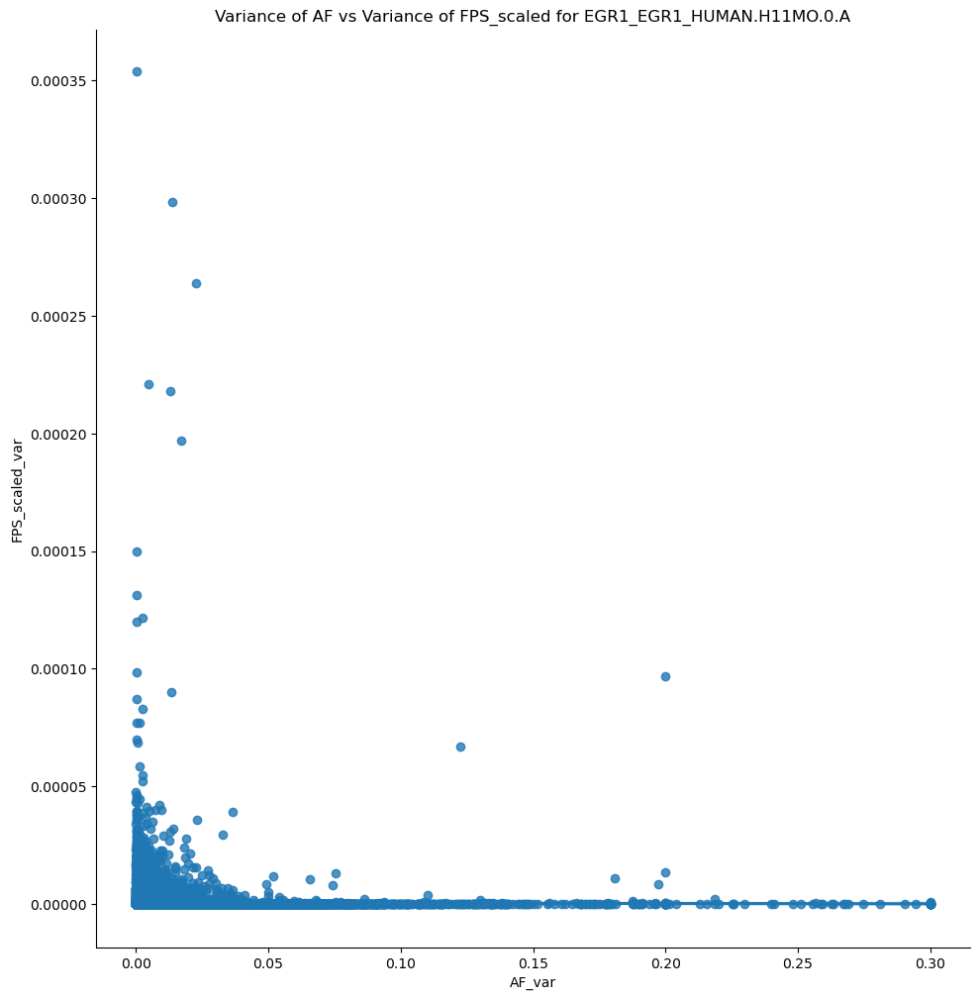

In [34]:
# plot lmplot
sns.lmplot(data=merged_stat_vars, x='AF_var', y='FPS_scaled_var', fit_reg=True, height=10)
plt.title(f'Variance of AF vs Variance of FPS_scaled for {motif_id}')
plt.show()

### Finding Covariant Sites 

Now that `merged_stat` contains the variance statistics for both AF and FPS values, we can find the sites that have high variance in both AF and FPS values. We can do this by filtering the `merged_stat` table to include only the rows where both `AF_var` and `FPS_scaled_var` are above a certain threshold.

To remove arbitrariness, **IQR outlier method** can be used to find the threshold for high variance.

In [35]:
merged_stat

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:818800-818817,2GAMBDQ_norm,0.937500,0.000380,0.001898,1.853793e-09
chr1:818800-818817,98JKPD8_lumA,0.909091,0.000397,0.001898,1.853793e-09
chr1:818800-818817,ANAB5F7_basal,0.843750,0.000357,0.001898,1.853793e-09
chr1:818800-818817,PU24GB8_lumB,0.842105,0.000286,0.001898,1.853793e-09
chr1:818800-818817,S6R691V_her2,0.852941,0.000337,0.001898,1.853793e-09
...,...,...,...,...,...
chrY:26403289-26403306,2GAMBDQ_norm,0.875000,0.000179,0.002049,7.160791e-10
chrY:26403289-26403306,98JKPD8_lumA,0.954545,0.000223,0.002049,7.160791e-10
chrY:26403289-26403306,ANAB5F7_basal,0.928571,0.000153,0.002049,7.160791e-10


In [36]:
# subset the dataframe to only include the AF_var and FPS_scaled_var columns and keep only unique rows
merged_stat_vars = merged_stat[['AF_var', 'FPS_scaled_var']].copy().drop_duplicates()
merged_stat_vars

,AF_var,FPS_scaled_var
region_id,,
chr1:818800-818817,0.001898,1.853793e-09
chr1:875872-875889,0.000413,8.383853e-10
chr1:875998-876015,0.007908,4.945841e-10
chr1:876155-876172,0.000413,2.880472e-09
chr1:876204-876221,0.002122,3.269122e-09
...,...,...
chrY:10092523-10092540,0.003125,1.239295e-09
chrY:11067859-11067876,0.200000,2.233370e-09
chrY:11067917-11067934,0.001020,1.250567e-09


We can plot boxplots to visualize the distribution of `AF_var` and `FPS_scaled_var` values.

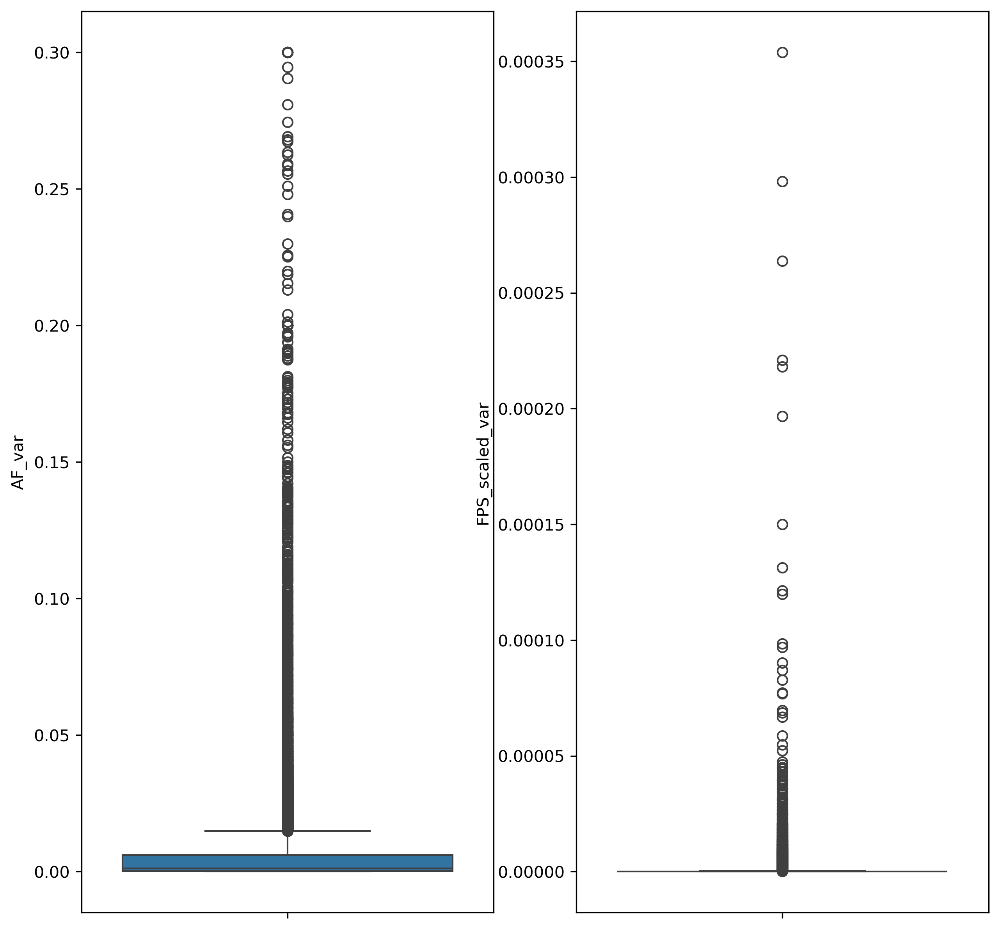

In [37]:
# plot bloxplots
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300)
sns.boxplot(data=merged_stat_vars, y='AF_var', ax=axs[0])
sns.boxplot(data=merged_stat_vars, y='FPS_scaled_var', ax=axs[1])
plt.show()

The distribution is highly skewed and we are looking at variances, not raw data points, so we can probably ignore the lower bounds and just use the upper bounds as the threshold to filter for potentially interesting sites. 




Calculate the distribution of `AF_var` and `FPS_scaled_var` values and then calculate the IQR for each. Then, calculate the upper and lower bounds for the `AF_var` and `FPS_scaled_var` values.

In [38]:
# Calculate the IQR for AF_var and FPS_scaled_var separately

q1_vaf = merged_stat_vars['AF_var'].quantile(0.25)
q3_vaf = merged_stat_vars['AF_var'].quantile(0.75)
iqr_vaf = q3_vaf - q1_vaf
lower_bound_outliers_vaf = q1_vaf - (1.5 * iqr_vaf)
upper_bound_outliers_vaf = q3_vaf + (1.5 * iqr_vaf)

# calculate IQR for FPS_scaled_var
q1_vfps = merged_stat_vars['FPS_scaled_var'].quantile(0.25)
q3_vfps = merged_stat_vars['FPS_scaled_var'].quantile(0.75)
iqr_vfps = q3_vfps - q1_vfps
lower_bound_outliers_vfps = q1_vfps - (1.5 * iqr_vfps)
upper_bound_outliers_vfps = q3_vfps + (1.5 * iqr_vfps)

print(f'Outlier bounds for {motif_id} AF variance: {lower_bound_outliers_vaf, upper_bound_outliers_vaf}')

print(f'Outlier bounds for {motif_id} FPS_scaled variance: {lower_bound_outliers_vfps, upper_bound_outliers_vfps}')

Outlier bounds for EGR1_EGR1_HUMAN.H11MO.0.A AF variance: (-0.008528730569823, 0.014906594133097)
Outlier bounds for EGR1_EGR1_HUMAN.H11MO.0.A FPS_scaled variance: (-1.0563435279295861e-07, 1.8181113727278083e-07)


In [39]:
# using the outlier fence of upper bound, get the region_id that are outliers for both AF_var and FPS_scaled_var
outlier_af_fps_vars = merged_stat_vars[(merged_stat_vars['AF_var'] > upper_bound_outliers_vaf) & (merged_stat_vars['FPS_scaled_var'] > upper_bound_outliers_vfps)]

outlier_af_fps_vars

,AF_var,FPS_scaled_var
region_id,,
chr1:940290-940307,0.035672,4.399860e-07
chr1:977045-977062,0.036731,5.846422e-06
chr1:977172-977189,0.200000,4.221585e-07
chr1:977204-977221,0.156171,5.057509e-07
chr1:977392-977409,0.300000,4.270002e-07
...,...,...
chrX:134670017-134670034,0.023744,2.705476e-07
chrX:135021873-135021890,0.016125,2.687676e-06
chrX:152942010-152942027,0.036116,2.295741e-07


In [40]:
# now extract the unique region IDs as a list from the outlier_af_fps_vars
outliers_list = outlier_af_fps_vars.index.tolist()

# subset the merged_stat dataframe to get the highly covariant sites (outlier sites)
covar_sites = merged_stat[merged_stat.index.isin(outliers_list)]

covar_sites

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:940290-940307,2GAMBDQ_norm,0.562500,0.002475,0.035672,4.399860e-07
chr1:940290-940307,98JKPD8_lumA,0.625000,0.003599,0.035672,4.399860e-07
chr1:940290-940307,ANAB5F7_basal,1.000000,0.002561,0.035672,4.399860e-07
chr1:940290-940307,PU24GB8_lumB,0.710526,0.003260,0.035672,4.399860e-07
chr1:940290-940307,S6R691V_her2,0.529412,0.004015,0.035672,4.399860e-07
...,...,...,...,...,...
chrX:154516407-154516424,2GAMBDQ_norm,1.000000,0.007578,0.022510,7.229667e-06
chrX:154516407-154516424,98JKPD8_lumA,0.875000,0.011522,0.022510,7.229667e-06
chrX:154516407-154516424,ANAB5F7_basal,0.588235,0.015045,0.022510,7.229667e-06


In [41]:
# sort the outlier sites by descending order of AF_var and FPS_scaled_var
covar_sites_sorted = covar_sites.sort_values(by=['AF_var', 'FPS_scaled_var'], ascending=[False, False])
covar_sites_sorted

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr17:75558880-75558897,2GAMBDQ_norm,0.000000,0.000489,0.300000,9.334482e-07
chr17:75558880-75558897,98JKPD8_lumA,0.000000,0.001633,0.300000,9.334482e-07
chr17:75558880-75558897,ANAB5F7_basal,1.000000,0.000521,0.300000,9.334482e-07
chr17:75558880-75558897,PU24GB8_lumB,0.000000,0.001007,0.300000,9.334482e-07
chr17:75558880-75558897,S6R691V_her2,1.000000,0.002808,0.300000,9.334482e-07
...,...,...,...,...,...
chr7:2193396-2193413,2GAMBDQ_norm,0.500000,0.001808,0.014955,6.708146e-07
chr7:2193396-2193413,98JKPD8_lumA,0.727273,0.002612,0.014955,6.708146e-07
chr7:2193396-2193413,ANAB5F7_basal,0.500000,0.000497,0.014955,6.708146e-07


We can plot to see the distributions.

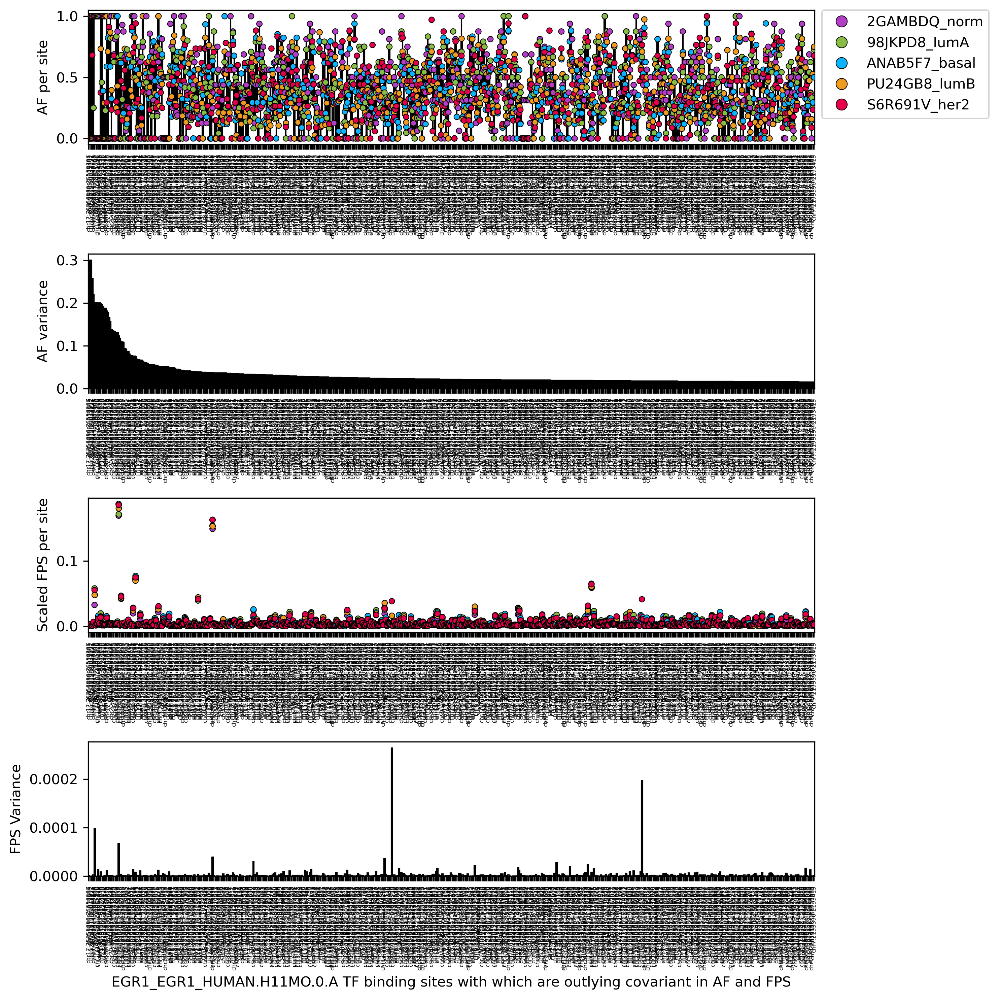

In [42]:
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=covar_sites_sorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=covar_sites_sorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF per site', fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=covar_sites_sorted, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF variance', fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=covar_sites_sorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=covar_sites_sorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('Scaled FPS per site', fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=covar_sites_sorted, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with which are outlying covariant in AF and FPS', fontsize=10)
plt.ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.tight_layout()
plt.show()

We can plot `lmplot` hued by `sample_id` to see if there are any patterns in the raw data.

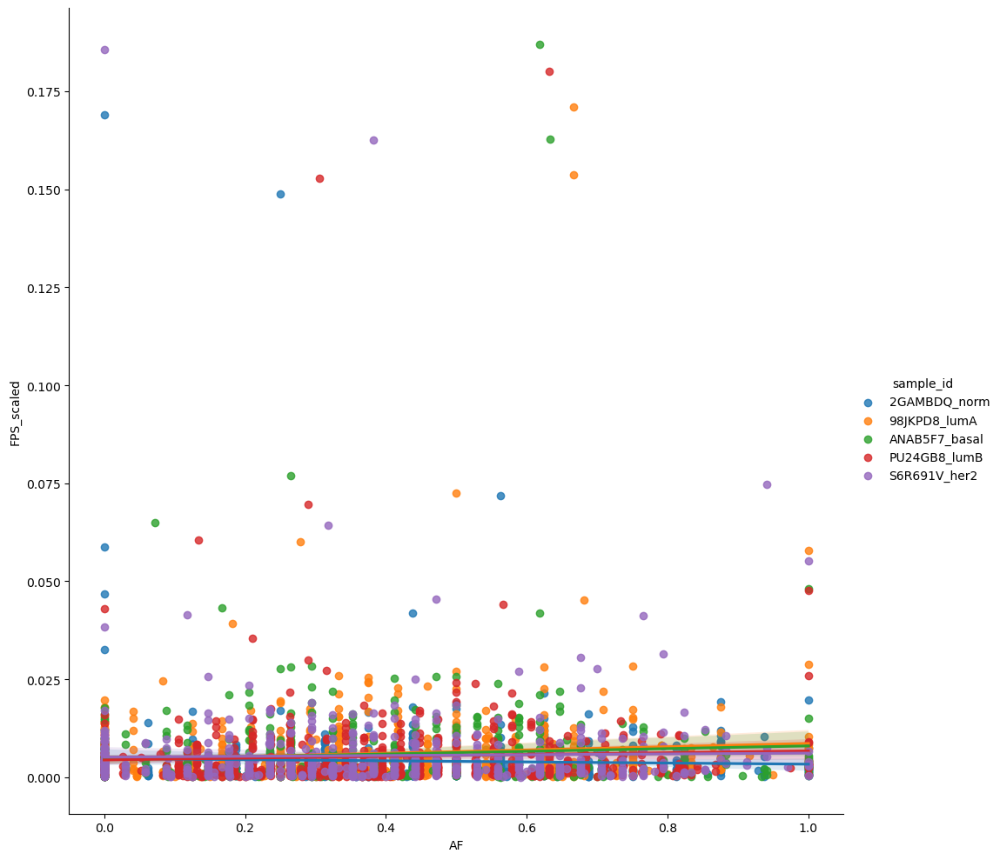

In [43]:
# plot jointplot of site_counts_sorted_top5
sns.lmplot(x='AF', y='FPS_scaled', data=covar_sites_sorted, hue='sample_id', fit_reg=True, height=10)

In [44]:
# test for correlation between AF and FPS_scaled for each subtype
from scipy.stats import spearmanr

# # Group by 'sample_id' and calculate the correlation for each group
# correlations = covar_sites_sorted.groupby('sample_id').apply(lambda group: spearmanr(group['AF'], group['FPS_scaled']), include_groups=False)

# correlations

covar_sites_sorted

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr17:75558880-75558897,2GAMBDQ_norm,0.000000,0.000489,0.300000,9.334482e-07
chr17:75558880-75558897,98JKPD8_lumA,0.000000,0.001633,0.300000,9.334482e-07
chr17:75558880-75558897,ANAB5F7_basal,1.000000,0.000521,0.300000,9.334482e-07
chr17:75558880-75558897,PU24GB8_lumB,0.000000,0.001007,0.300000,9.334482e-07
chr17:75558880-75558897,S6R691V_her2,1.000000,0.002808,0.300000,9.334482e-07
...,...,...,...,...,...
chr7:2193396-2193413,2GAMBDQ_norm,0.500000,0.001808,0.014955,6.708146e-07
chr7:2193396-2193413,98JKPD8_lumA,0.727273,0.002612,0.014955,6.708146e-07
chr7:2193396-2193413,ANAB5F7_basal,0.500000,0.000497,0.014955,6.708146e-07


How about we group by region_id?

In [45]:
covar_sites_sorted_novars = covar_sites_sorted.drop(columns=['AF_var', 'FPS_scaled_var'])
covar_sites_sorted_novars

,sample_id,AF,FPS_scaled
region_id,,,
chr17:75558880-75558897,2GAMBDQ_norm,0.000000,0.000489
chr17:75558880-75558897,98JKPD8_lumA,0.000000,0.001633
chr17:75558880-75558897,ANAB5F7_basal,1.000000,0.000521
chr17:75558880-75558897,PU24GB8_lumB,0.000000,0.001007
chr17:75558880-75558897,S6R691V_her2,1.000000,0.002808
...,...,...,...
chr7:2193396-2193413,2GAMBDQ_norm,0.500000,0.001808
chr7:2193396-2193413,98JKPD8_lumA,0.727273,0.002612
chr7:2193396-2193413,ANAB5F7_basal,0.500000,0.000497


In [46]:
# reset index to make region_id a column
covar_sites_sorted_novars = covar_sites_sorted_novars.reset_index()
covar_sites_sorted_novars

,region_id,sample_id,AF,FPS_scaled
0,chr17:75558880-75558897,2GAMBDQ_norm,0.000000,0.000489
1,chr17:75558880-75558897,98JKPD8_lumA,0.000000,0.001633
2,chr17:75558880-75558897,ANAB5F7_basal,1.000000,0.000521
3,chr17:75558880-75558897,PU24GB8_lumB,0.000000,0.001007
4,chr17:75558880-75558897,S6R691V_her2,1.000000,0.002808
...,...,...,...,...
3015,chr7:2193396-2193413,2GAMBDQ_norm,0.500000,0.001808
3016,chr7:2193396-2193413,98JKPD8_lumA,0.727273,0.002612
3017,chr7:2193396-2193413,ANAB5F7_basal,0.500000,0.000497
3018,chr7:2193396-2193413,PU24GB8_lumB,0.750000,0.002035


#### Spearman Correlation Test between AF and FPS_scaled

In [47]:
# Group by 'region_id' and calculate the correlation between AF and FPS_scaled for each group
correlations = covar_sites_sorted_novars.groupby('region_id').apply(lambda group: spearmanr(group['AF'], group['FPS_scaled']), include_groups=False)

correlations

region_id
chr10:100998572-100998589                     (-0.7, 0.18812040437418728)
chr10:102775681-102775698    (0.9999999999999999, 1.4042654220543672e-24)
chr10:1049466-1049483           (-0.19999999999999998, 0.747060078104662)
chr10:125041498-125041515                     (-0.6, 0.28475697986529375)
chr10:125160698-125160715       (-0.30779350562554625, 0.614384002810333)
                                                 ...                     
chrX:3345697-3345714          (-0.49999999999999994, 0.39100221895577053)
chrX:42943727-42943744        (-0.46169025843831935, 0.43376615616902786)
chrX:44282643-44282660          (0.7071067811865475, 0.18169011381620928)
chrX:44439419-44439436         (-0.8999999999999998, 0.03738607346849875)
chrX:72554507-72554524         (-0.09999999999999999, 0.8728885715695383)
Length: 604, dtype: object

In [48]:
# that returned a pandas Series, so convert to dataframe
correlations_df = pd.DataFrame(correlations, columns=['corr_coeff_and_pvalue'])
# split the 'corr_coeff_and_pvalue' column into two separate columns using apply() and pd.Series
correlations_df[['corr_coeff', 'pvalue']] = correlations_df['corr_coeff_and_pvalue'].apply(pd.Series)
# drop the original column
correlations_df = correlations_df.drop(columns=['corr_coeff_and_pvalue']).reset_index()
correlations_df

,region_id,corr_coeff,pvalue
0,chr10:100998572-100998589,-0.700000,1.881204e-01
1,chr10:102775681-102775698,1.000000,1.404265e-24
2,chr10:1049466-1049483,-0.200000,7.470601e-01
3,chr10:125041498-125041515,-0.600000,2.847570e-01
4,chr10:125160698-125160715,-0.307794,6.143840e-01
...,...,...,...
599,chrX:3345697-3345714,-0.500000,3.910022e-01
600,chrX:42943727-42943744,-0.461690,4.337662e-01
601,chrX:44282643-44282660,0.707107,1.816901e-01
602,chrX:44439419-44439436,-0.900000,3.738607e-02


In [49]:
# now sort region_id naturally
correlations_df_srt = correlations_df.reindex(index=index_natsorted(correlations_df['region_id']))
corr_df = correlations_df_srt.reset_index(drop=True)
corr_df

,region_id,corr_coeff,pvalue
0,chr1:940290-940307,-0.400000,5.046316e-01
1,chr1:977045-977062,1.000000,1.404265e-24
2,chr1:977172-977189,0.000000,1.000000e+00
3,chr1:977204-977221,0.500000,3.910022e-01
4,chr1:977392-977409,0.288675,6.376181e-01
...,...,...,...
599,chrX:134670017-134670034,-0.200000,7.470601e-01
600,chrX:135021873-135021890,0.000000,1.000000e+00
601,chrX:152942010-152942027,-0.410391,4.925358e-01
602,chrX:154341579-154341596,0.666886,2.188940e-01


In [50]:
# filter for pvalue < 0.05
corr_df_sig = corr_df[corr_df['pvalue'] < 0.05]
corr_df_sig

,region_id,corr_coeff,pvalue
1,chr1:977045-977062,1.000000,1.404265e-24
10,chr1:2232116-2232133,-0.900000,3.738607e-02
23,chr1:24932328-24932345,0.900000,3.738607e-02
26,chr1:39691469-39691486,-1.000000,1.404265e-24
40,chr1:151993868-151993885,-0.900000,3.738607e-02
66,chr1:226408335-226408352,0.900000,3.738607e-02
69,chr1:244451190-244451207,-0.900000,3.738607e-02
74,chr2:3605539-3605556,-0.900000,3.738607e-02
80,chr2:20180501-20180518,-0.900000,3.738607e-02
89,chr2:64328063-64328080,0.900000,3.738607e-02


#### Multiple Testing Correction
Now we need to correct for multiple testing. We can use the Benjamini-Hochberg method to correct for multiple testing.

In [51]:
from statsmodels.stats.multitest import multipletests

# apply Benjamini/Hochberg FDR correction
pvals = corr_df['pvalue']
fdr_corr = multipletests(pvals, alpha=0.05, method='fdr_bh')
# this returns a tuple of 4 elements, 1. boolean array indicating whether the null hypothesis is rejected for each test, 2. corrected pvalues, 3. corrected alpha for Sidak multiple testing, 4. corrected alpha for Bonferroni multiple testing

In [52]:
# add the corrected pvalues array to the dataframe
corr_df_corrected = corr_df.copy()
corr_df_corrected['fdr_adj_pvalue'] = fdr_corr[1]

# filter for corrected pvalue < 0.05
corr_df_corrected_sig = corr_df_corrected[corr_df_corrected['fdr_adj_pvalue'] < 0.05]
corr_df_corrected_sig

,region_id,corr_coeff,pvalue,fdr_adj_pvalue
1,chr1:977045-977062,1.0,1.404265e-24,5.654509e-23
26,chr1:39691469-39691486,-1.0,1.404265e-24,5.654509e-23
116,chr3:126476150-126476167,1.0,1.404265e-24,5.654509e-23
139,chr4:128525504-128525521,1.0,1.404265e-24,5.654509e-23
211,chr7:33062169-33062186,1.0,1.404265e-24,5.654509e-23
222,chr7:97930849-97930866,1.0,1.404265e-24,5.654509e-23
226,chr7:127392750-127392767,-1.0,1.404265e-24,5.654509e-23
304,chr10:102775681-102775698,1.0,1.404265e-24,5.654509e-23
312,chr11:560798-560815,-1.0,1.404265e-24,5.654509e-23
318,chr11:9314761-9314778,-1.0,1.404265e-24,5.654509e-23


In [53]:
# look at the original values
# get the rows where the region_id == chr1:977045-977062
covar_sites_sorted_novars[covar_sites_sorted_novars['region_id'] == 'chr1:977045-977062']

,region_id,sample_id,AF,FPS_scaled
500,chr1:977045-977062,2GAMBDQ_norm,0.750000,0.008273
501,chr1:977045-977062,98JKPD8_lumA,1.000000,0.010321
502,chr1:977045-977062,ANAB5F7_basal,0.500000,0.004689
503,chr1:977045-977062,PU24GB8_lumB,0.763158,0.009220
504,chr1:977045-977062,S6R691V_her2,0.588235,0.005494


In [54]:
covar_sites_sorted_novars[covar_sites_sorted_novars['region_id'] == 'chr1:39691469-39691486']

,region_id,sample_id,AF,FPS_scaled
2135,chr1:39691469-39691486,2GAMBDQ_norm,0.500000,0.003982
2136,chr1:39691469-39691486,98JKPD8_lumA,0.208333,0.004644
2137,chr1:39691469-39691486,ANAB5F7_basal,0.264706,0.004615
2138,chr1:39691469-39691486,PU24GB8_lumB,0.315789,0.004350
2139,chr1:39691469-39691486,S6R691V_her2,0.147059,0.005329


#### ASIDE: Visualization of Correlation Coefficients at Filtered Covariant Sites

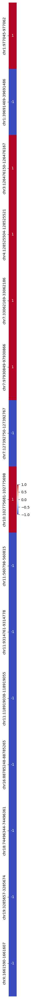

In [55]:
corr_df_i = corr_df_corrected_sig.set_index('region_id')

# Convert the DataFrame to a 2D format suitable for a heatmap
df_2d = corr_df_i['corr_coeff'].to_numpy().reshape(-1, 1)

# Create a heatmap
plt.figure(figsize=(0.5,50))  # Adjust the figure size as needed
sns.heatmap(df_2d, annot=True, cmap='coolwarm', xticklabels=False, yticklabels=corr_df_i.index)
plt.show()

In [9]:
# import os
# import csv

# def extract_motif_names(path, extension, output_file):
#     data = []
#     for root, _, files in os.walk(path):
#         for file in files:
#             if file.endswith(extension):
#                 with open(os.path.join(root, file)) as f:
#                     first_line = f.readline()
#                     split_line = first_line.split()
#                     if len(split_line) > 1:
#                         tf_tuple = (split_line[0][1:], split_line[1])
#                         data.append(tf_tuple)
    
#     # sort the list of tuples by the first element, then second element
#     data.sort(key=lambda x: (x[1], x[0]))

#     # write the sorted list of tuples to a file
#     with open(output_file, 'w', newline='') as out_file:
#         writer = csv.writer(out_file, delimiter='\t')
#         writer.writerows(data)


# path = '/Users/sufyazi/Documents/local-storage/bioinf/repos/reference-TF-motifs/combined-filt-individual-motifs/individuals'
# extension = '.jaspar'
# output_file = '/Users/sufyazi/Documents/local-storage/bioinf/repos/reference-TF-motifs/combined-filt-individual-motifs/tf-motif-IDs-and-tf-names.tsv'

# extract_motif_names(path, extension, output_file)


## Annotating Covariant Sites

First extract TF IDs and TF classes from a manually curated TSV.

In [56]:
# first load the data table
annot_data = pd.read_csv('/Users/sufyazi/Documents/local-storage/bioinf/repos/reference-TF-motifs/combined-filt-individual-motifs/TF-motif-full-metadata-manual.tsv', sep='\t', header=0)

In [57]:
# Replace NaN values with 'N/A'
annot_data.fillna('N/A', inplace=True)

In [58]:
annot_data

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
0,AHR_HUMAN.H11MO.0.B,AHR,basic helix-loop-helix (bHLH) factors,PAS domain factors,Ahr-like factors
1,AIRE_HUMAN.H11MO.0.C,AIRE,SAND domain factors,AIRE,AIRE
2,ALX1_HUMAN.H11MO.0.B,ALX1,homeo domain factors,paired-related HD factors,ALX
3,ANDR_HUMAN.H11MO.0.A,ANDR,nuclear receptors with C4 zinc fingers,steroid hormone receptors (NR3),GR-like receptors (NR3C)
4,AP2A_HUMAN.H11MO.0.A,AP2A,basic helix-span-helix (bHSH) factors,activating protein 2 (AP-2),N/A
...,...,...,...,...,...
1355,MA1602.1,ZSCAN29,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF500-like factors
1356,M08365_2.00,ZSCAN30,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
1357,M08270_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors
1358,M08393_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors


In [59]:
annot_data[annot_data['tf_name'] == 'STAT1STAT2']

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
771,MA0517.1,STAT1STAT2,STAT domain factors,STAT factors,N/A


In [60]:
annot_data[annot_data['tf_family'] == 'T-brain-related factors']

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
789,TBX21_HUMAN.H11MO.0.A,TBX21,T-box factors,T-brain-related factors,N/A


The `motif_id` in this data table is not the same as the `motif_id` in the `merged_filt` table. This is because for some databases the TF name is not a part of the motif ID and thus need to be manually added. 

In [61]:
# go through the motif_id column and use the corresponding value in the tf_name column to do a match
# if there is a match, do nothing, else, add the tf_name to the motif_id by prefixing it and adding an underscore

# def add_prefix(row):
#     if row['tf_name'] not in row['motif_id']:
#         return row['tf_name'] + '_' + row['motif_id']
#     else:
#         return row['motif_id']

# scratch that; the motif_id in the other data table have redundant tf_name prefixes, so just use the motif_id as is

def add_prefix(row):
    return row['tf_name'] + '_' + row['motif_id']

annot_data['motif_id'] = annot_data.apply(add_prefix, axis=1)

In [62]:
annot_data

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
0,AHR_AHR_HUMAN.H11MO.0.B,AHR,basic helix-loop-helix (bHLH) factors,PAS domain factors,Ahr-like factors
1,AIRE_AIRE_HUMAN.H11MO.0.C,AIRE,SAND domain factors,AIRE,AIRE
2,ALX1_ALX1_HUMAN.H11MO.0.B,ALX1,homeo domain factors,paired-related HD factors,ALX
3,ANDR_ANDR_HUMAN.H11MO.0.A,ANDR,nuclear receptors with C4 zinc fingers,steroid hormone receptors (NR3),GR-like receptors (NR3C)
4,AP2A_AP2A_HUMAN.H11MO.0.A,AP2A,basic helix-span-helix (bHSH) factors,activating protein 2 (AP-2),N/A
...,...,...,...,...,...
1355,ZSCAN29_MA1602.1,ZSCAN29,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF500-like factors
1356,ZSCAN30_M08365_2.00,ZSCAN30,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
1357,ZSCAN31_M08270_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors
1358,ZSCAN31_M08393_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors


In [63]:
annot_data.head()

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
0,AHR_AHR_HUMAN.H11MO.0.B,AHR,basic helix-loop-helix (bHLH) factors,PAS domain factors,Ahr-like factors
1,AIRE_AIRE_HUMAN.H11MO.0.C,AIRE,SAND domain factors,AIRE,AIRE
2,ALX1_ALX1_HUMAN.H11MO.0.B,ALX1,homeo domain factors,paired-related HD factors,ALX
3,ANDR_ANDR_HUMAN.H11MO.0.A,ANDR,nuclear receptors with C4 zinc fingers,steroid hormone receptors (NR3),GR-like receptors (NR3C)
4,AP2A_AP2A_HUMAN.H11MO.0.A,AP2A,basic helix-span-helix (bHSH) factors,activating protein 2 (AP-2),N/A


In [64]:
# save the dataframe to a new file
annot_data.to_csv('/Users/sufyazi/Documents/local-storage/bioinf/repos/reference-TF-motifs/combined-filt-individual-motifs/TF-motif-full-metadata-manual.processed.tsv', sep='\t', index=False)

#### Visualizing Annotation Data

We can visualize the distribution of TF classes and TF IDs in the annotation data with a barplot.

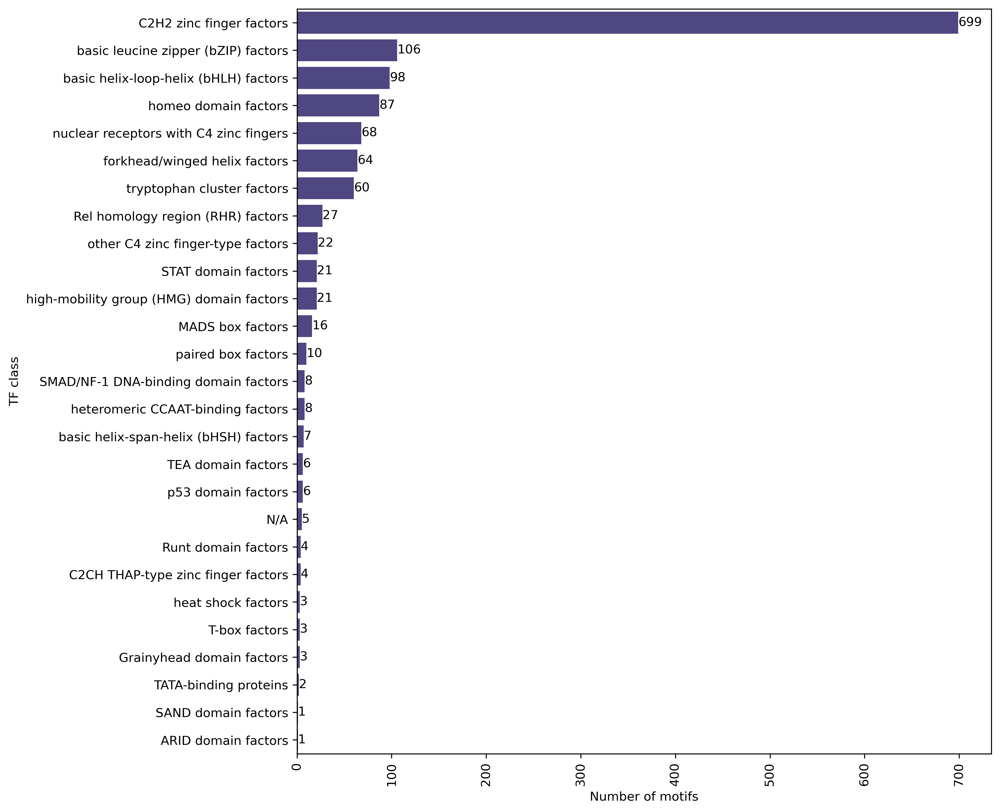

In [85]:
# Get the order of categories based on their counts
order = annot_data['tf_class'].value_counts().index

# Create a larger figure
plt.figure(figsize=(10, len(order) * 0.4), dpi=300)

# Create a countplot with the order
ax = sns.countplot(y='tf_class', data=annot_data, order=order,color='darkslateblue')

# Add counts to the bars
for p in ax.patches:
    width = p.get_width()
    plt.text(width,  
             p.get_y() + p.get_height() / 2,
             '{:1.0f}'.format(width),
             ha = 'left',
             va = 'center')

# Rotate x-axis labels for readability if they are long
plt.xticks(rotation=90)

#  y axis label
plt.ylabel('TF class')
# x axis label
plt.xlabel('Number of motifs')

# Save the plot as a high-resolution PDF
plt.savefig("/Users/sufyazi/Documents/local-storage/bioinf/repos/fps-var-integration-local/output-data/plots/tf/TF-class-motif-counts-barplot.pdf", format='pdf', dpi=300)

# Show the plot
plt.show()

In [120]:
# Calculate the percentage for each tf_class
tf_class_counts = annot_data['tf_class'].value_counts()
total_counts = len(annot_data)
tf_class_percent = (tf_class_counts / total_counts) * 100

# Create a dictionary mapping each tf_class to a color from the custom palette
artemis = ["#003f5c", "#374c80", "#7a5195", "#bc5090", "#ef5675", "#ff764a", "#ffa600"]
unique_classes = tf_class_counts.index
color_dict = {tf_class: color for tf_class, color in zip(unique_classes, artemis)}

# Create a DataFrame for the pie chart
pie_data = pd.DataFrame({
    'tf_class': annot_data['tf_class'],
    'color': annot_data['color'],
    'count': 1
}).groupby(['tf_class', 'color']).count().reset_index()

# Create pie chart 
fig = px.pie(pie_data, names='tf_class', values='count', color='color', color_discrete_sequence=pie_data['color'].unique(), title='TF Class Motif Counts')
fig.update_traces(textinfo='percent+label', textposition='inside', insidetextorientation='radial')

# Update the layout to make the pie chart larger
fig.update_layout(width=1000, height=1000)

fig.show()

In [121]:
# Save the figure as a high-resolution PNG image
pio.write_image(fig, '/Users/sufyazi/Documents/local-storage/bioinf/repos/fps-var-integration-local/output-data/plots/tf/TF-class-motif-percents-piechart.pdf', scale=8)

In [99]:
# Get the counts of each category in the 'tf_class' column
class_counts = annot_data['tf_class'].value_counts().to_frame()

# Rename the column for clarity
class_counts.columns = ['Motif Counts']

# rename the index to 'TF class'
class_counts.index.name = 'TF class'

# Display the DataFrame with conditional formatting
class_counts.style.background_gradient(cmap='Blues')

,Motif Counts
TF class,
C2H2 zinc finger factors,699
basic leucine zipper (bZIP) factors,106
basic helix-loop-helix (bHLH) factors,98
homeo domain factors,87
nuclear receptors with C4 zinc fingers,68
forkhead/winged helix factors,64
tryptophan cluster factors,60
Rel homology region (RHR) factors,27
other C4 zinc finger-type factors,22


In [100]:
# Group by 'tf_class' and 'tf_family', and get the counts
class_family_counts = annot_data.groupby(['tf_class', 'tf_family']).size().reset_index(name='Counts')

# Display the DataFrame with conditional formatting
class_family_counts.style.background_gradient(cmap='Blues')

,tf_class,tf_family,Counts
0,ARID domain factors,ARID-related factors,1
1,C2CH THAP-type zinc finger factors,THAP-related factors,4
2,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,87
3,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers ZNF134-like factors,1
4,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,557
5,C2H2 zinc finger factors,other factors with up to three adjacent zinc fingers,4
6,C2H2 zinc finger factors,three-zinc finger Krüppel-related factors,50
7,Grainyhead domain factors,Grainyhead-related factors,3
8,MADS box factors,regulators of differentiation,11
9,MADS box factors,responders to external signals (SRF/RLM1),5


In [101]:
# Group by 'tf_class' and 'tf_family', and get the counts
class_family_counts = annot_data.groupby(['tf_class', 'tf_family']).size()

# Convert the series to a DataFrame and reset the index
class_family_counts = class_family_counts.to_frame(name='Counts').reset_index()

# Set a multi-index on 'tf_class' and 'family'
class_family_counts_multindex = class_family_counts.set_index(['tf_class', 'tf_family'])

# Display the DataFrame
# class_family_counts
class_family_counts_multindex

Counts
tf_class                           tf_family                                                 
ARID domain factors                ARID-related factors                                     1
C2CH THAP-type zinc finger factors THAP-related factors                                     4
C2H2 zinc finger factors           factors with multiple dispersed zinc fingers            87
                                   factors with multiple dispersed zinc fingers ZN...       1
                                   more than 3 adjacent zinc finger factors               557
...                                                                                       ...
paired box factors                 paired domain only                                       9
                                   paired plus homeo domain                                 1
tryptophan cluster factors         Ets-related factors                                     46
                                   Myb/SANT domain factors                                  5
                                   interferon-regulatory factors                            9

[68 rows x 1 columns]

In [102]:
class_family_counts_multindex.to_excel('/Users/sufyazi/Documents/local-storage/bioinf/repos/fps-var-integration-local/output-data/plots/tf/TF-motif-class-family-counts.xlsx')

In [127]:
# draw hierarchical sunburst plot
orpurr = ["#03071e", "#370617", "#6a040f", "#9d0208", "#d00000", "#dc2f02", "#e85d04", "#f48c06", "#faa307", "#ffba08"]
fig = px.sunburst(class_family_counts, path=['tf_class', 'tf_family'], values='Counts', color='Counts', color_continuous_scale='Bluyl_r', title='TF class and family motif counts in the curated PWM set')

# Update the layout
fig.update_layout(width=1000, height=1000)

fig.show()


In [128]:
# Save the figure as a high-resolution PNG image
pio.write_image(fig, '/Users/sufyazi/Documents/local-storage/bioinf/repos/fps-var-integration-local/output-data/plots/tf/TF-class-and-family-motif-cat-sunburstplot.pdf', scale=8)

### Merging Annotation Data with Covariant Sites

In [129]:
# load the processed data tables

annot_data = pd.read_csv('/Users/sufyazi/Documents/local-storage/bioinf/repos/reference-TF-motifs/combined-filt-individual-motifs/TF-motif-full-metadata-manual.processed.tsv', sep='\t', header=0)

annot_data

,motif_id,tf_name,tf_class,tf_family,tf_subfamily
0,AHR_AHR_HUMAN.H11MO.0.B,AHR,basic helix-loop-helix (bHLH) factors,PAS domain factors,Ahr-like factors
1,AIRE_AIRE_HUMAN.H11MO.0.C,AIRE,SAND domain factors,AIRE,AIRE
2,ALX1_ALX1_HUMAN.H11MO.0.B,ALX1,homeo domain factors,paired-related HD factors,ALX
3,ANDR_ANDR_HUMAN.H11MO.0.A,ANDR,nuclear receptors with C4 zinc fingers,steroid hormone receptors (NR3),GR-like receptors (NR3C)
4,AP2A_AP2A_HUMAN.H11MO.0.A,AP2A,basic helix-span-helix (bHSH) factors,activating protein 2 (AP-2),NaN
...,...,...,...,...,...
1355,ZSCAN29_MA1602.1,ZSCAN29,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF500-like factors
1356,ZSCAN30_M08365_2.00,ZSCAN30,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
1357,ZSCAN31_M08270_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors
1358,ZSCAN31_M08393_2.00,ZSCAN31,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF24-like factors


In [130]:
# load the covariant sites data
sig_covariant_sites = pd.read_csv('/Users/sufyazi/Documents/local-storage/bioinf/repos/fps-var-integration-local/output-data/covariant-site-counts/AF_FPS-covariant_sites_significant.combined.tsv', sep='\t', header=0)

sig_covariant_sites

,orig_index,motif_id,region_id,corr_coeff,pvalues,adj_pvalues
0,71,AIRE_AIRE_HUMAN.H11MO.0.C,chr16:3282261-3282279,-1.0,1.404265e-24,4.446841e-23
1,77,AIRE_AIRE_HUMAN.H11MO.0.C,chr17:49374914-49374932,1.0,1.404265e-24,4.446841e-23
2,24,AIRE_AIRE_HUMAN.H11MO.0.C,chr6:76866202-76866220,1.0,1.404265e-24,4.446841e-23
3,14,ALX1_ALX1_HUMAN.H11MO.0.B,chr2:225782219-225782231,1.0,1.404265e-24,6.740474e-23
4,244,ANDR_ANDR_HUMAN.H11MO.0.A,chr14:99571643-99571661,-1.0,1.404265e-24,1.507245e-22
...,...,...,...,...,...,...
4896,122,ZSCAN31_M08393_2.00,chr18:13246839-13246854,-1.0,1.404265e-24,9.689431e-23
4897,36,ZSCAN31_M08393_2.00,chr5:53402883-53402898,-1.0,1.404265e-24,9.689431e-23
4898,37,ZSCAN5C_M08390_2.00,chr7:133512687-133512702,1.0,1.404265e-24,3.744708e-23
4899,36,ZSCAN5C_M08390_2.00,chr7:98352788-98352803,-1.0,1.404265e-24,3.744708e-23


### Load the allelic information from the original data table


In [110]:
allelic_df = dt_afps.filter(regex='_allele$|_pos$|_id$').copy()
allelic_df.head(5)

,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,2GAMBDQ_norm_alt_allele,98JKPD8_lumA_varsite_pos,98JKPD8_lumA_ref_allele,98JKPD8_lumA_alt_allele,ANAB5F7_basal_varsite_pos,ANAB5F7_basal_ref_allele,ANAB5F7_basal_alt_allele,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,region_id
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91475.0,G,A,NaN,NaN,NaN,chr1:91471-91488
1,136962.0,C,T,NaN,NaN,NaN,136962.0,C,T,136962.0,C,T,136962.0,C,T,chr1:136956-136973
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,chr1:181096-181113
3,NaN,NaN,NaN,181526.0,C,T,181526.0,C,T,181526.0,C,T,181526.0,C,T,chr1:181520-181537
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,181583.0,CGGGGGGGGGGGGGGGGG,CGGGGGGGGGGGGG,chr1:181577-181594


In [113]:
# check if region_id is not unique
region_id_counts = allelic_df['region_id'].value_counts()
if region_id_counts.max() > 1:
    print(f"region_id is not unique: {region_id_counts.idxmax()}")
else:
    print("region_id column is unique")


region_id column is unique


Hence we can move region_id as index.

In [114]:
allelic_df_long = allelic_df.melt(id_vars=["region_id"], var_name="variable", value_name="value")
allelic_df_long

,region_id,variable,value
0,chr1:91471-91488,2GAMBDQ_norm_varsite_pos,NaN
1,chr1:136956-136973,2GAMBDQ_norm_varsite_pos,136962.0
2,chr1:181096-181113,2GAMBDQ_norm_varsite_pos,NaN
3,chr1:181520-181537,2GAMBDQ_norm_varsite_pos,NaN
4,chr1:181577-181594,2GAMBDQ_norm_varsite_pos,NaN
...,...,...,...
909115,chrY:11136400-11136417,S6R691V_her2_alt_allele,TCCCCCCCC
909116,chrY:11136547-11136564,S6R691V_her2_alt_allele,TCCCCCCC
909117,chrY:11153536-11153553,S6R691V_her2_alt_allele,C
909118,chrY:14328812-14328829,S6R691V_her2_alt_allele,A


In [118]:
# Create a new column 'type' based on the 'variable' column
allelic_df_long['type'] = np.where(allelic_df_long['variable'].str.contains('_pos'), 'pos', 'allele')
allelic_df_long

,region_id,variable,value,type
0,chr1:91471-91488,2GAMBDQ_norm_varsite_pos,NaN,pos
1,chr1:136956-136973,2GAMBDQ_norm_varsite_pos,136962.0,pos
2,chr1:181096-181113,2GAMBDQ_norm_varsite_pos,NaN,pos
3,chr1:181520-181537,2GAMBDQ_norm_varsite_pos,NaN,pos
4,chr1:181577-181594,2GAMBDQ_norm_varsite_pos,NaN,pos
...,...,...,...,...
909115,chrY:11136400-11136417,S6R691V_her2_alt_allele,TCCCCCCCC,allele
909116,chrY:11136547-11136564,S6R691V_her2_alt_allele,TCCCCCCC,allele
909117,chrY:11153536-11153553,S6R691V_her2_alt_allele,C,allele
909118,chrY:14328812-14328829,S6R691V_her2_alt_allele,A,allele


In [119]:
# split the dataframe into two based on the 'type' column
allelic_pos = allelic_df_long[allelic_df_long['type'] == 'pos']
allelic_pos

,region_id,variable,value,type
0,chr1:91471-91488,2GAMBDQ_norm_varsite_pos,NaN,pos
1,chr1:136956-136973,2GAMBDQ_norm_varsite_pos,136962.0,pos
2,chr1:181096-181113,2GAMBDQ_norm_varsite_pos,NaN,pos
3,chr1:181520-181537,2GAMBDQ_norm_varsite_pos,NaN,pos
4,chr1:181577-181594,2GAMBDQ_norm_varsite_pos,NaN,pos
...,...,...,...,...
787899,chrY:11136400-11136417,S6R691V_her2_varsite_pos,11136406.0,pos
787900,chrY:11136547-11136564,S6R691V_her2_varsite_pos,11136553.0,pos
787901,chrY:11153536-11153553,S6R691V_her2_varsite_pos,11153550.0,pos
787902,chrY:14328812-14328829,S6R691V_her2_varsite_pos,14328827.0,pos


In [120]:
allelic_allele = allelic_df_long[allelic_df_long['type'] == 'allele']
allelic_allele

,region_id,variable,value,type
60608,chr1:91471-91488,2GAMBDQ_norm_ref_allele,NaN,allele
60609,chr1:136956-136973,2GAMBDQ_norm_ref_allele,C,allele
60610,chr1:181096-181113,2GAMBDQ_norm_ref_allele,NaN,allele
60611,chr1:181520-181537,2GAMBDQ_norm_ref_allele,NaN,allele
60612,chr1:181577-181594,2GAMBDQ_norm_ref_allele,NaN,allele
...,...,...,...,...
909115,chrY:11136400-11136417,S6R691V_her2_alt_allele,TCCCCCCCC,allele
909116,chrY:11136547-11136564,S6R691V_her2_alt_allele,TCCCCCCC,allele
909117,chrY:11153536-11153553,S6R691V_her2_alt_allele,C,allele
909118,chrY:14328812-14328829,S6R691V_her2_alt_allele,A,allele


Now get the region_id as a list from the significant covariant sites.

In [116]:
# get region_id from sig_covariant_sites
region_ids = sig_covariant_sites['region_id'].tolist()
len(region_ids)

4901

In [117]:
# filter the allelic_df_long to only include region_ids in region_ids
allelic_df_long_filt = allelic_df_long[allelic_df_long['region_id'].isin(region_ids)]
allelic_df_long_filt

,region_id,variable,value
46,chr1:977045-977062,2GAMBDQ_norm_varsite_pos,977055.0
1942,chr1:39691469-39691486,2GAMBDQ_norm_varsite_pos,39691471.0
11633,chr3:126476150-126476167,2GAMBDQ_norm_varsite_pos,NaN
14611,chr4:128525504-128525521,2GAMBDQ_norm_varsite_pos,128525510.0
22240,chr7:33062169-33062186,2GAMBDQ_norm_varsite_pos,33062175.0
...,...,...,...
884538,chr11:118919038-118919055,S6R691V_her2_alt_allele,C
894999,chr16:88785248-88785265,S6R691V_her2_alt_allele,G
899429,chr18:74496344-74496361,S6R691V_her2_alt_allele,A
900187,chr19:3285657-3285674,S6R691V_her2_alt_allele,ACCCCCCCCC


In [25]:
# group the merged dataframe by 'motif_id' and count the number of unique 'region_id' values
motif_counts = sig_covariant_sites.groupby('motif_id')['region_id'].nunique().reset_index()

# rename the 'region_id' column to 'site_counts'
motif_counts = motif_counts.rename(columns={'region_id': 'site_counts'})

# sort rows by 'region_id' in descending order
motif_counts = motif_counts.sort_values(by='site_counts', ascending=False)

motif_counts

,motif_id,site_counts
801,ZN770_ZN770_HUMAN.H11MO.0.C,27
773,ZN281_ZN281_HUMAN.H11MO.0.A,27
869,ZNF263_M08082_2.00,26
342,KLF6_KLF6_HUMAN.H11MO.0.A,26
695,WT1_WT1_HUMAN.H11MO.0.C,24
...,...,...
351,LHX2_MA0700.2,1
352,LHX3_LHX3_HUMAN.H11MO.0.C,1
355,MAFF_M07839_2.00,1
357,MAFF_MA0495.3,1


In [30]:
# merge the two dataframes on 'motif_id'
merged_annot_covar = motif_counts.merge(annot_data, on='motif_id')

merged_annot_covar.head(10)

,motif_id,site_counts,tf_name,tf_class,tf_family,tf_subfamily
0,ZN770_ZN770_HUMAN.H11MO.0.C,27,ZN770,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,unclassified
1,ZN281_ZN281_HUMAN.H11MO.0.A,27,ZN281,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF148-like factors
2,ZNF263_M08082_2.00,26,ZNF263,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
3,KLF6_KLF6_HUMAN.H11MO.0.A,26,KLF6,C2H2 zinc finger factors,three-zinc finger Krüppel-related factors,Krüppel-like factors
4,WT1_WT1_HUMAN.H11MO.0.C,24,WT1,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
5,ZN467_ZN467_HUMAN.H11MO.0.C,23,ZN467,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,unclassified
6,SP4_SP4_HUMAN.H11MO.0.A,22,SP4,C2H2 zinc finger factors,three-zinc finger Krüppel-related factors,Sp1-like factors
7,SP3_SP3_HUMAN.H11MO.0.B,22,SP3,C2H2 zinc finger factors,three-zinc finger Krüppel-related factors,Sp1-like factors
8,SP2_SP2_HUMAN.H11MO.0.A,22,SP2,C2H2 zinc finger factors,three-zinc finger Krüppel-related factors,Sp1-like factors
9,PATZ1_PATZ1_HUMAN.H11MO.0.C,22,PATZ1,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,MAZ-like factors


In [43]:
merged_annot_covar.iloc[10:50]

,motif_id,site_counts,tf_name,tf_class,tf_family,tf_subfamily
10,ZNF383_M07689_2.00,21,ZNF383,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF620-like factors
11,MAZ_MAZ_HUMAN.H11MO.0.A,21,MAZ,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,MAZ-like factors
12,ZN263_ZN263_HUMAN.H11MO.0.A,19,ZN263,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
13,ZNF263_M07843_2.00,19,ZNF263,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
14,PRDM9_MA1723.1,19,PRDM9,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
15,ZNF529_M07678_2.00,19,ZNF529,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
16,ZBT17_ZBT17_HUMAN.H11MO.0.A,19,ZBT17,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,unclassified
17,ZNF341_M08310_2.00,18,ZNF341,C2H2 zinc finger factors,factors with multiple dispersed zinc fingers,unclassified
18,ZSC22_ZSC22_HUMAN.H11MO.0.C,18,ZSC22,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,unclassified
19,ZNF432_M07773_2.00,18,ZNF432,C2H2 zinc finger factors,more than 3 adjacent zinc finger factors,ZNF432-like factors


In [42]:
# plot countplot of motif counts
plt.figure(figsize=(10, 150), dpi=300)
p = sns.barplot(x='site_counts', y='motif_id', data=merged_annot_covar, color='green', edgecolor='black')
p.tick_params(axis='y', labelsize=6)
plt.show()

We can get the `motif_id` column from the `motif_counts` table, and filter the original `sig_covariant_sites` table to include only the rows where the `motif_id` is in the `motif_id` column of `motif_counts`.

In [28]:
# subset the sig_covariant_sites dataframe to only include the 'motif_id' in the motif_counts dataframe
# the order of the rows in the sig_covariant_sites should follow the order of the motif_counts dataframe

sig_covar_sites_filt = motif_counts[['motif_id']].merge(sig_covariant_sites, on='motif_id')
sig_covar_sites_filt


,motif_id,orig_index,region_id,corr_coeff,pvalues,adj_pvalues
0,ZN770_ZN770_HUMAN.H11MO.0.C,722,chr10:49916101-49916123,1.0,1.404265e-24,7.687053e-23
1,ZN770_ZN770_HUMAN.H11MO.0.C,815,chr11:126421569-126421591,1.0,1.404265e-24,7.687053e-23
2,ZN770_ZN770_HUMAN.H11MO.0.C,788,chr11:69123148-69123170,-1.0,1.404265e-24,7.687053e-23
3,ZN770_ZN770_HUMAN.H11MO.0.C,767,chr11:9314760-9314782,-1.0,1.404265e-24,7.687053e-23
4,ZN770_ZN770_HUMAN.H11MO.0.C,859,chr12:120496042-120496064,1.0,1.404265e-24,7.687053e-23
...,...,...,...,...,...,...
4896,LHX2_MA0700.2,35,chr20:12153927-12153938,1.0,1.404265e-24,5.617062e-23
4897,LHX3_LHX3_HUMAN.H11MO.0.C,3,chr1:109726195-109726208,-1.0,1.404265e-24,6.319194e-23
4898,MAFF_M07839_2.00,46,chr8:6541215-6541230,-1.0,1.404265e-24,1.488521e-22
4899,MAFF_MA0495.3,108,chr17:57946393-57946409,-1.0,1.404265e-24,1.685119e-22


In [29]:
# show rows where 'motif_id' == 'ZN770_ZN770_HUMAN.H11MO.0.C'
sig_covar_sites_filt[sig_covar_sites_filt['motif_id'] == 'ZN770_ZN770_HUMAN.H11MO.0.C']

,motif_id,orig_index,region_id,corr_coeff,pvalues,adj_pvalues
0,ZN770_ZN770_HUMAN.H11MO.0.C,722,chr10:49916101-49916123,1.0,1.404265e-24,7.687053e-23
1,ZN770_ZN770_HUMAN.H11MO.0.C,815,chr11:126421569-126421591,1.0,1.404265e-24,7.687053e-23
2,ZN770_ZN770_HUMAN.H11MO.0.C,788,chr11:69123148-69123170,-1.0,1.404265e-24,7.687053e-23
3,ZN770_ZN770_HUMAN.H11MO.0.C,767,chr11:9314760-9314782,-1.0,1.404265e-24,7.687053e-23
4,ZN770_ZN770_HUMAN.H11MO.0.C,859,chr12:120496042-120496064,1.0,1.404265e-24,7.687053e-23
5,ZN770_ZN770_HUMAN.H11MO.0.C,886,chr13:23322762-23322784,-1.0,1.404265e-24,7.687053e-23
6,ZN770_ZN770_HUMAN.H11MO.0.C,949,chr15:30991957-30991979,1.0,1.404265e-24,7.687053e-23
7,ZN770_ZN770_HUMAN.H11MO.0.C,1020,chr16:23642002-23642024,1.0,1.404265e-24,7.687053e-23
8,ZN770_ZN770_HUMAN.H11MO.0.C,1038,chr16:56965005-56965027,-1.0,1.404265e-24,7.687053e-23
9,ZN770_ZN770_HUMAN.H11MO.0.C,1111,chr17:39451785-39451807,-1.0,1.404265e-24,7.687053e-23


In [32]:
sig_covar_sites_filt[sig_covar_sites_filt['motif_id'] == 'ZN281_ZN281_HUMAN.H11MO.0.A']

,motif_id,orig_index,region_id,corr_coeff,pvalues,adj_pvalues
27,ZN281_ZN281_HUMAN.H11MO.0.A,410,chr10:32957975-32957990,1.0,1.404265e-24,4.420836e-23
28,ZN281_ZN281_HUMAN.H11MO.0.A,465,chr11:118919038-118919053,-1.0,1.404265e-24,4.420836e-23
29,ZN281_ZN281_HUMAN.H11MO.0.A,437,chr11:560800-560815,-1.0,1.404265e-24,4.420836e-23
30,ZN281_ZN281_HUMAN.H11MO.0.A,452,chr11:69123153-69123168,-1.0,1.404265e-24,4.420836e-23
31,ZN281_ZN281_HUMAN.H11MO.0.A,528,chr14:70907984-70907999,1.0,1.404265e-24,4.420836e-23
32,ZN281_ZN281_HUMAN.H11MO.0.A,563,chr15:69358558-69358573,-1.0,1.404265e-24,4.420836e-23
33,ZN281_ZN281_HUMAN.H11MO.0.A,598,chr16:85760031-85760046,-1.0,1.404265e-24,4.420836e-23
34,ZN281_ZN281_HUMAN.H11MO.0.A,601,chr16:88785254-88785269,-1.0,1.404265e-24,4.420836e-23
35,ZN281_ZN281_HUMAN.H11MO.0.A,659,chr17:73283925-73283940,1.0,1.404265e-24,4.420836e-23
36,ZN281_ZN281_HUMAN.H11MO.0.A,744,chr19:43439422-43439437,1.0,1.404265e-24,4.420836e-23
